In [1]:
using Plots
using Base.Threads

# Lucas Schmidt Ferreira de Araujo

In [2]:
function GOF(nt::Int, L::Int, G0::Matrix{Int})
    G = zeros(Int, nt, L, L)
    G[1, :, :] .= G0 

    for q in 1:nt-1
        for m in 2:L-1
            for n in 2:L-1
                neighbors = G[q, m-1:m+1, n-1:n+1]
                alive_neighbors = sum(neighbors) - G[q, m, n]
                if G[q, m, n] == 1
                    G[q+1, m, n] = (alive_neighbors == 2 || alive_neighbors == 3) ? 1 : 0
                else
                    G[q+1, m, n] = (alive_neighbors == 3) ? 1 : 0
                end
            end
        end
    end
    return G
end

function GOFT(nt::Int, L::Int, G0::Matrix{Int})
    """Game of Life on Torus"""
    G = zeros(Int, nt, L, L)
    G[1, :, :] .= G0 

    for q in 1:nt-1
        for m in 1:L
            for n in 1:L
                up = (m == 1) ? L : m - 1
                down = (m == L) ? 1 : m + 1
                left = (n == 1) ? L : n - 1
                right = (n == L) ? 1 : n + 1
                
                alive_neighbors = G[q, up, left] + G[q, up, n] + G[q, up, right] +
                                  G[q, m, left] + G[q, m, right] +
                                  G[q, down, left] + G[q, down, n] + G[q, down, right]
                
                if G[q, m, n] == 1
                    G[q+1, m, n] = (alive_neighbors == 2 || alive_neighbors == 3) ? 1 : 0
                else
                    G[q+1, m, n] = (alive_neighbors == 3) ? 1 : 0
                end
            end
        end
    end
    return G
end

function GOF_Simulate( G0::Matrix{Int}) 
    nt = 0
    L,L = size(G0)
    G = zeros(Int, 2, L, L)
    G[1, :, :] .= G0 
    change = sum( G[1, :, :] ) - sum( G[2, :, :] )
    while( change != 0 )
        q = (nt) % 2 + 1
        q_ = (nt+1) % 2 + 1
        for m in 2:L-1
            for n in 2:L-1
                neighbors = G[q, m-1:m+1, n-1:n+1]
                alive_neighbors = sum(neighbors) - G[q, m, n]
                if G[q, m, n] == 1
                    G[q_, m, n] = (alive_neighbors == 2 || alive_neighbors == 3) ? 1 : 0
                else
                    G[q_, m, n] = (alive_neighbors == 3) ? 1 : 0
                end
            end
        end
        change = sum( G[q_, :, :] ) - sum( G[q, :, :] )
        G[q,:,:] .= 0
        nt+=1
    end
    return sum(G[nt % 2 + 1,:,:]) , nt
end

GOF_Simulate (generic function with 1 method)

## Block

┌ Info: Saved animation to /tmp/jl_W90dcVihE5.gif
└ @ Plots /home/lucas/.julia/packages/Plots/kLeqV/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_W90dcVihE5.gif")
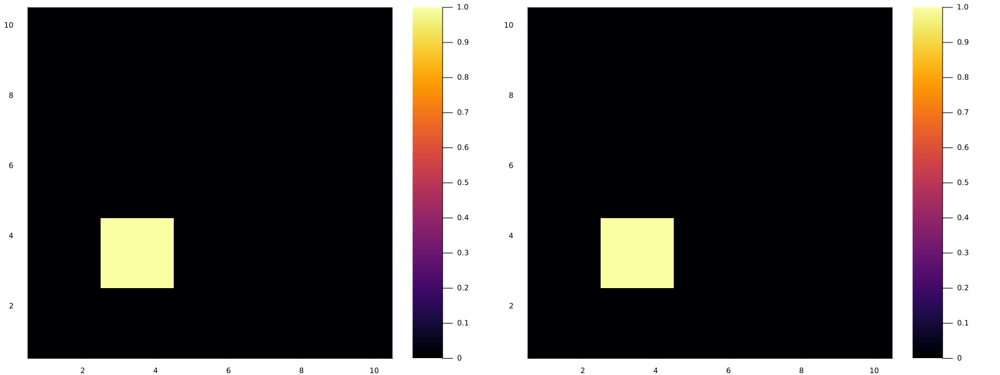

In [3]:
L = 10
nt = 2

function block(L::Int)
    G0 = zeros(Int, L, L)
    G0[3:4, 3:4] .= 1 
    return G0
end

G0 = block(L)
G = GOF(nt,L,G0)
fig = @animate for q in 1:nt
    p1 = heatmap( G0 )
    p2 = heatmap( G[q,:,:] )
    plot(p1,p2,size=(1600,600))
end
gif(fig)

## Blinker

┌ Info: Saved animation to /tmp/jl_Wxo7MzkhSv.gif
└ @ Plots /home/lucas/.julia/packages/Plots/kLeqV/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_Wxo7MzkhSv.gif")
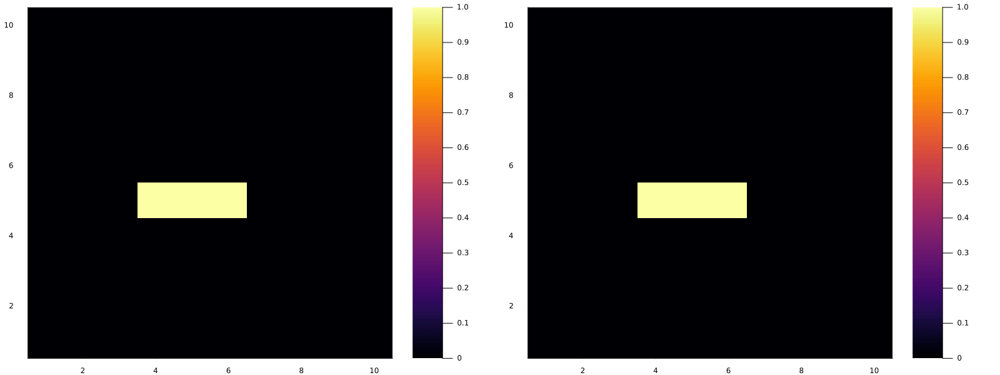

In [4]:
nt = 20
L = 10

function blinker(L::Int)
    G0 = zeros(Int, L, L)
    G0[5, 4:6] .= 1  # Horizontal line of 3 cells
    return G0
end

G0 = blinker(L)
G = GOF(nt,L,G0)
fig = @animate for q in 1:nt
    p1 = heatmap( G0 )
    p2 = heatmap( G[q,:,:] )
    plot(p1,p2,size=(1600,600))
end
gif(fig , fps = 10)

## Glider

┌ Info: Saved animation to /tmp/jl_c54xwDQnej.gif
└ @ Plots /home/lucas/.julia/packages/Plots/kLeqV/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_c54xwDQnej.gif")
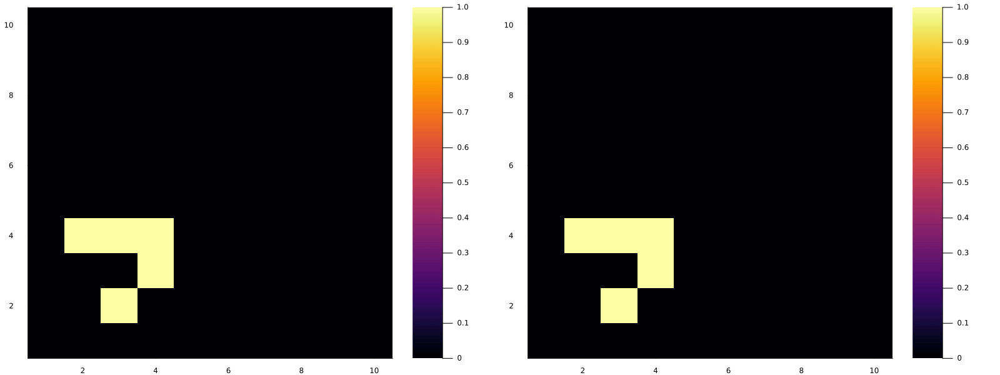

In [5]:
L = 10
nt = 100

function glider(L::Int)
    G0 = zeros(Int, L, L)
    G0[2, 3] = 1
    G0[3, 4] = 1
    G0[4, 2:4] .= 1
    return G0
end

G0 = glider(L)
G = GOFT(nt,L,G0)
fig = @animate for q in 1:nt
    p1 = heatmap( G0 )
    p2 = heatmap( G[q,:,:] )
    plot(p1,p2,size=(1600,600))
end
gif(fig , fps = 10)

## Pulsar

┌ Info: Saved animation to /tmp/jl_SFq1Ab01up.gif
└ @ Plots /home/lucas/.julia/packages/Plots/kLeqV/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_SFq1Ab01up.gif")
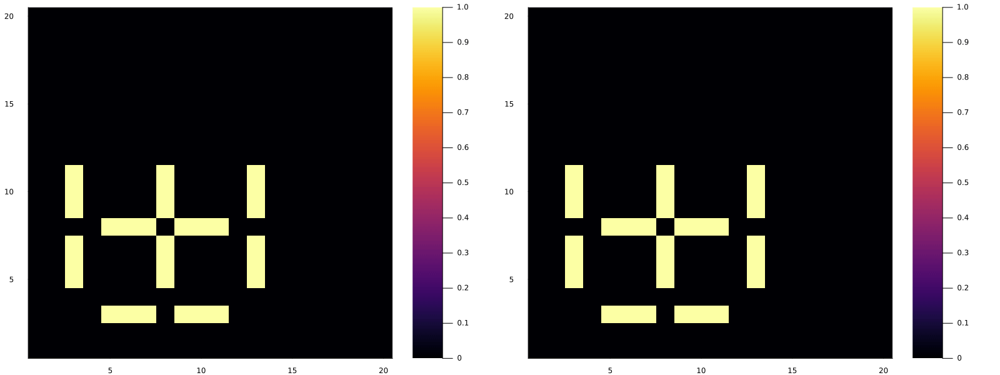

In [6]:
L = 20
nt = 20

function pulsar(L::Int)
    G0 = zeros(Int, L, L)
    live_cells = [
        (3, 5), (3, 6), (3, 7), (3, 9), (3, 10), (3, 11),
        (5, 3), (6, 3), (7, 3), (9, 3), (10, 3), (11, 3),
        (5, 8), (6, 8), (7, 8), (9, 8), (10, 8), (11, 8),
        (5, 13), (6, 13), (7, 13), (9, 13), (10, 13), (11, 13),
        (8, 5), (8, 6), (8, 7), (8, 9), (8, 10), (8, 11)
    ]
    for (i, j) in live_cells
        G0[i, j] = 1
    end
    
    return G0
end

G0 = pulsar(L)
G = GOF(nt,L,G0)
fig = @animate for q in 1:nt
    p1 = heatmap( G0 )
    p2 = heatmap( G[q,:,:] )
    plot(p1,p2,size=(1600,600))
end
gif(fig , fps = 10)

## Glider Gun

┌ Info: Saved animation to /tmp/jl_cXW7AhQTGr.gif
└ @ Plots /home/lucas/.julia/packages/Plots/kLeqV/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_cXW7AhQTGr.gif")
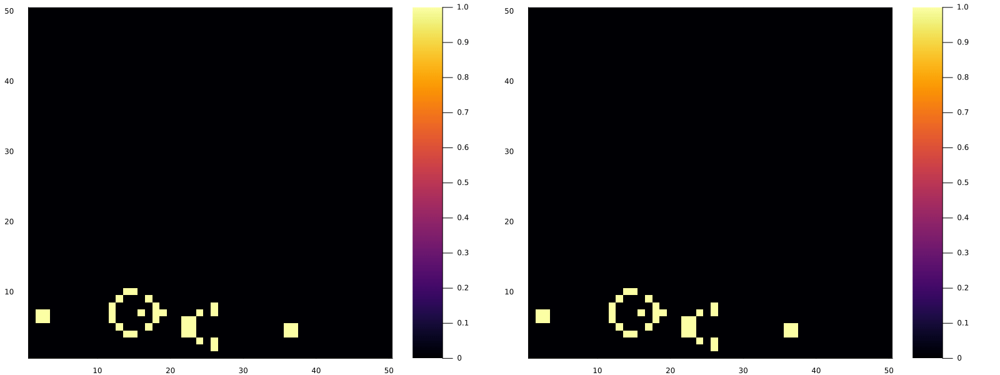

In [7]:
L = 50
nt = 200

function glider_gun(L::Int)
    G0 = zeros(Int, L, L)
        live_cells = [
        (6, 2), (6, 3), (7, 2), (7, 3),             
        (6, 12), (7, 12), (8, 12),                  
        (5, 13), (9, 13),                           
        (4, 14), (10, 14),                          
        (4, 15), (10, 15),
        (7, 16),
        (5, 17), (9, 17),
        (6, 18), (7, 18), (8, 18),
        (7, 19),
        (4, 22), (5, 22), (6, 22),                  
        (4, 23), (5, 23), (6, 23),
        (3, 24), (7, 24),                           
        (2, 26), (3, 26), (7, 26), (8, 26),         
        (4, 36), (5, 36), (4, 37), (5, 37)          
    ]
    for (i, j) in live_cells
        G0[i, j] = 1
    end
    return G0
end

G0 = glider_gun(L)
G = GOFT(nt,L,G0)
fig = @animate for q in 1:nt
    p1 = heatmap( G0 )
    p2 = heatmap( G[q,:,:] )
    plot(p1,p2,size=(1600,600))
end
gif(fig , fps = 10)

┌ Info: Saved animation to /tmp/jl_q5yzqpiXmV.gif
└ @ Plots /home/lucas/.julia/packages/Plots/kLeqV/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_q5yzqpiXmV.gif")
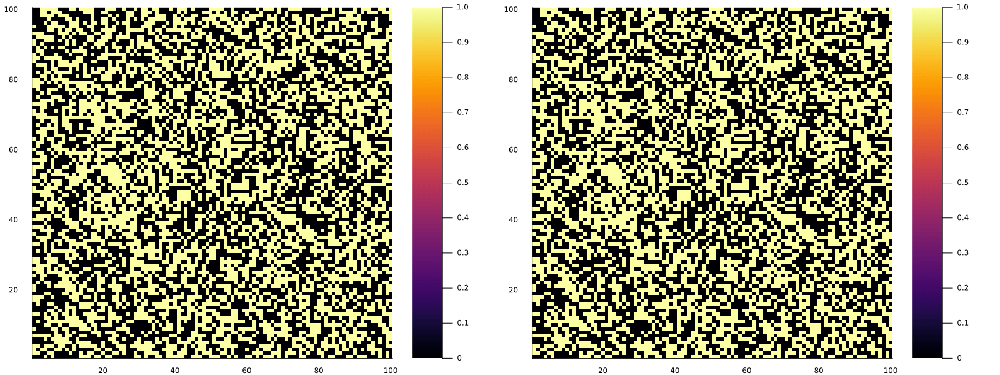

In [8]:
L = 100
nt = 1000

G0 = Int.(rand(L,L) .> .5)
G = GOF(nt,L,G0)
GT = GOFT(nt,L,G0)
fig = @animate for q in 1:nt
    p1 = heatmap( GT[q,:,:] )
    p2 = heatmap( G[q,:,:])
    plot(p1,p2,size=(1600,600))
end
gif(fig)

┌ Info: Saved animation to /tmp/jl_CT8HklOB6J.gif
└ @ Plots /home/lucas/.julia/packages/Plots/kLeqV/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_CT8HklOB6J.gif")
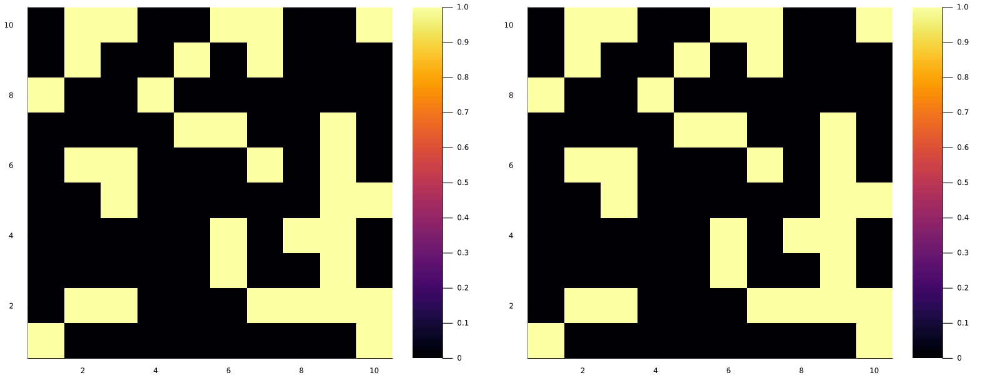

In [9]:
L = 10
nt = 100

G0 = Int.(rand(L,L) .> .7)
G = GOF(nt,L,G0)
GT = GOFT(nt,L,G0)
fig = @animate for q in 1:nt
    p1 = heatmap( GT[q,:,:] )
    p2 = heatmap( G[q,:,:])
    plot(p1,p2,size=(1600,600))
end
gif(fig)

┌ Info: Saved animation to /tmp/jl_Sz07ch0jKd.gif
└ @ Plots /home/lucas/.julia/packages/Plots/kLeqV/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_Sz07ch0jKd.gif")
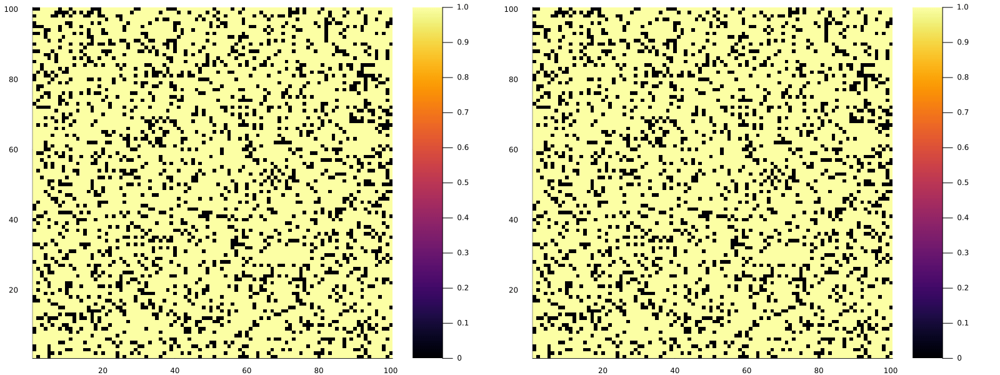

In [10]:
L = 100
nt = 1000

G0 = Int.(rand(L,L) .> .2)
G = GOF(nt,L,G0)
GT = GOFT(nt,L,G0)
fig = @animate for q in 1:nt
    p1 = heatmap( GT[q,:,:] )
    p2 = heatmap( G[q,:,:])
    plot(p1,p2,size=(1600,600))
end
gif(fig)